In [1]:
import requests
import seaborn as sns
import plotly.express as px
import pycountry as pc
import json
import pandas as pd
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from pyjstat import pyjstat

def get_tsa(country):
    country = country.title()
    url = f"https://travel.state.gov/content/travel/en/international-travel/International-Travel-Country-Information-Pages/{country}.html"

    url_html = requests.get(url).text

    soup = BeautifulSoup(url_html)

    return soup.find_all(class_='tsg-rwd-eab-title-frame')

In [2]:
print(get_tsa('canada'))

[<h3 class="tsg-rwd-eab-title-frame">Worldwide Caution</h3>, <h3 class="tsg-rwd-eab-title-frame">Information for U.S. Citizens in the Middle East</h3>, <h3 class="tsg-rwd-eab-title-frame">Canada - Level 1: Exercise Normal Precautions</h3>]


In [3]:
def get_eurostat_data(article_title, *args):
    '''
    To Do:
        - Write *args
        - Write _url_builder() helper func.
    '''
    
    article_title = article_title.upper()
    url = f'https://ec.europa.eu/eurostat/api/dissemination/statistics/1.0/data/{article_title}?format=JSON&lang=EN'

    output = pyjstat.Dataset.read(url)
    df = output.write('dataframe')

    return df

In [4]:
crime = get_eurostat_data('crim_off_cat')

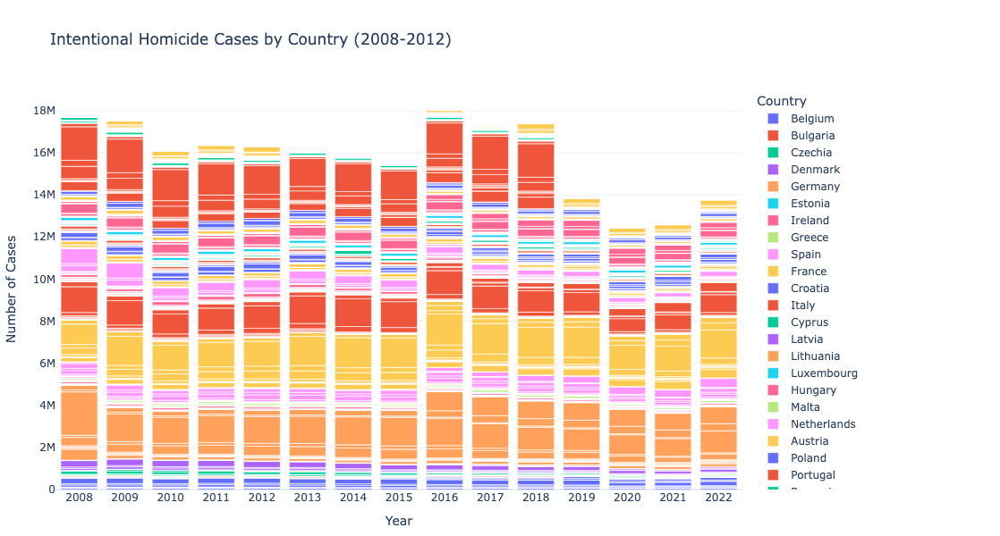

In [5]:
# Lineplot - cases per nation over time
fig = px.bar(crime, x='Time', y='value', color='Geopolitical entity (reporting)',
              title='Intentional Homicide Cases by Country (2008-2012)')
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Number of Cases',
    legend_title='Country',
    template='plotly_white',
    width=1000,  # Set the width of the plot
    height=600,  # Set the height of the plot
    margin=dict(l=50, r=50, t=100, b=50)
)
fig.show()

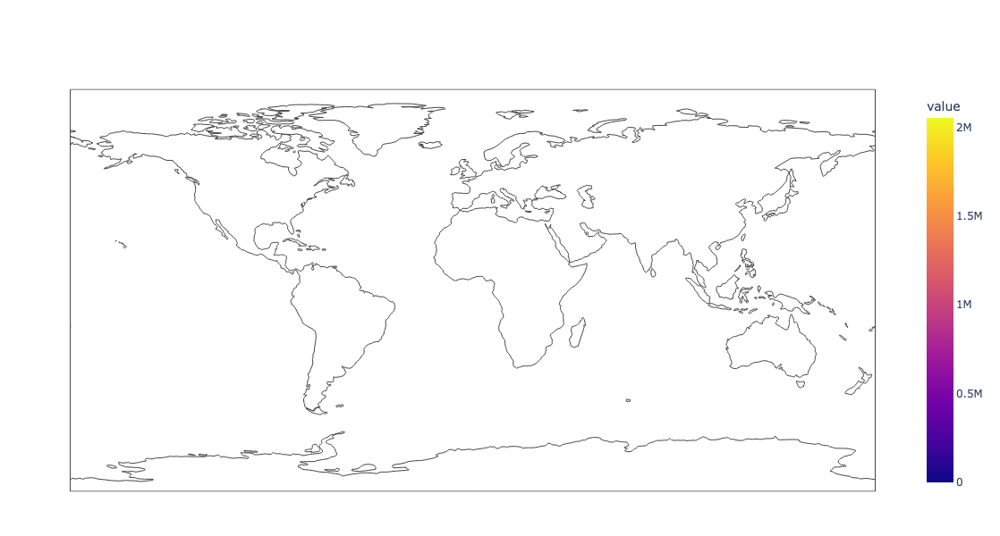

In [6]:
# Lineplot - cases per nation over time
fig = px.choropleth(crime, locations='Geopolitical entity (reporting)', color='value', hover_name='Geopolitical entity (reporting)', color_continuous_scale=px.colors.sequential.Plasma)
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Number of Cases',
    legend_title='Country',
    template='plotly_white',
    width=1000,  # Set the width of the plot
    height=600,  # Set the height of the plot
    margin=dict(l=50, r=50, t=100, b=50)
)
fig.show()

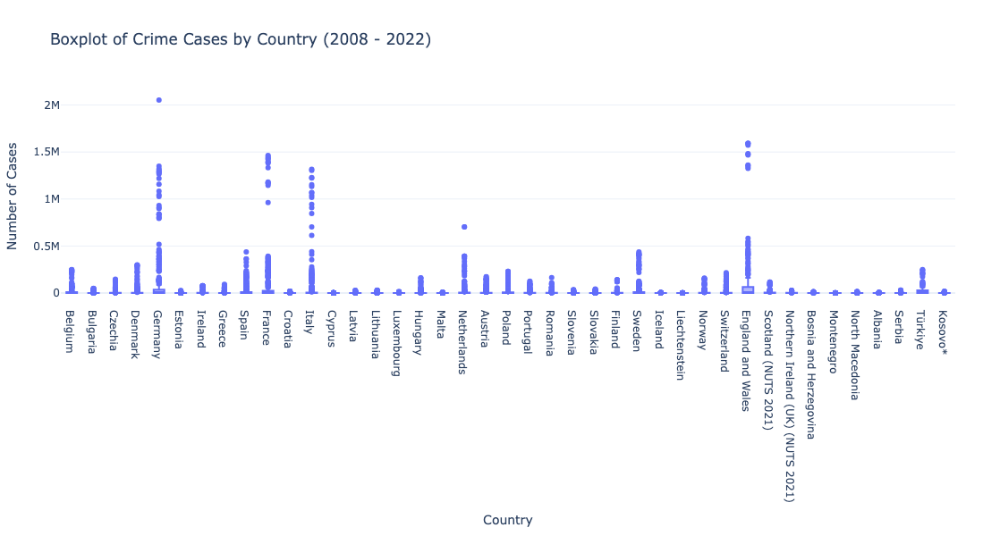

In [7]:
# Create a box plot using Plotly
fig_box = px.box(crime, x='Geopolitical entity (reporting)', y='value',
                 title=f'Boxplot of Crime Cases by Country ({crime['Time'].min()} - {crime['Time'].max()})')

fig_box.update_layout(
    xaxis_title='Country',
    yaxis_title='Number of Cases',
    template='plotly_white',
    width=900,  # Set the width of the plot
    height=600,  # Set the height of the plot
    margin=dict(l=50, r=50, t=100, b=50)  # Add margins to prevent squishing
)

fig_box.show()

In [8]:
crime

,Time frequency,International classification of crime for statistical purposes (ICCS),Unit of measure,Geopolitical entity (reporting),Time,value
0,Annual,Intentional homicide,Number,Belgium,2008,204.00
1,Annual,Intentional homicide,Number,Belgium,2009,189.00
2,Annual,Intentional homicide,Number,Belgium,2010,189.00
3,Annual,Intentional homicide,Number,Belgium,2011,214.00
4,Annual,Intentional homicide,Number,Belgium,2012,206.00
...,...,...,...,...,...,...
25825,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2018,0.11
25826,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2019,0.17
25827,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2020,0.28
25828,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2021,NaN


In [9]:
happiness = get_eurostat_data('ilc_pw08')
happiness = happiness.drop(happiness[happiness.Frequency == 'Unknown'].index)
happiness

,Time frequency,Unit of measure,International Standard Classification of Education (ISCED 2011),Frequency,Sex,Age class,Geopolitical entity (reporting),Time,value
0,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2013,16.2
1,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2018,19.5
2,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2022,19.1
3,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,Belgium,2013,16.7
4,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,Belgium,2018,18.7
...,...,...,...,...,...,...,...,...,...
69421,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Türkiye,2018,NaN
69422,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Türkiye,2022,NaN
69423,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Kosovo*,2013,NaN
69424,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Kosovo*,2018,NaN


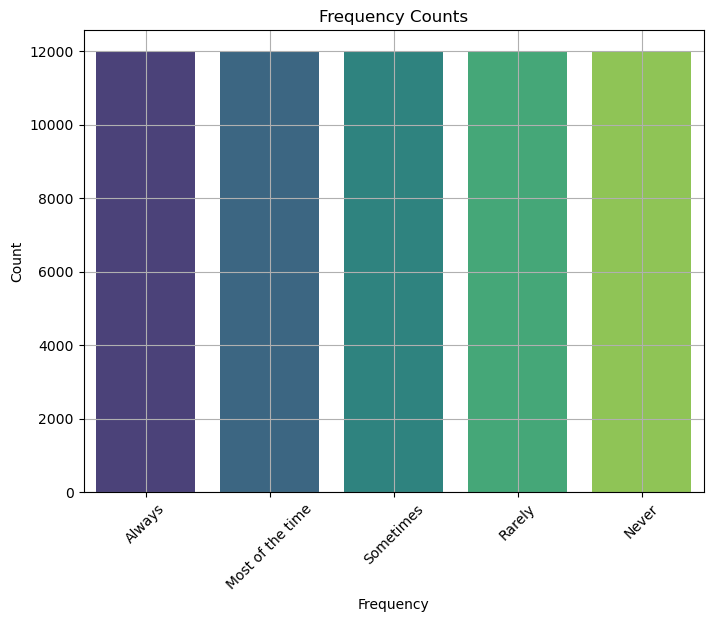

In [10]:
# Plot the frequency column values
plt.figure(figsize=(8, 6))
sns.countplot(x='Frequency', data=happiness, palette='viridis', hue='Frequency')
plt.title('Frequency Counts')
plt.xlabel('Frequency')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [11]:
train_system = get_eurostat_data('ttr00015')
train_system

,Time frequency,Unit of measure,Transport coverage,Geopolitical entity (reporting),Time,value
0,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2011,NaN
1,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2012,NaN
2,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2013,NaN
3,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2014,NaN
4,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2015,375713.0
...,...,...,...,...,...,...
475,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2018,4374.0
476,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2019,4912.0
477,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2020,1520.0
478,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2021,2251.0


In [12]:
leisure = get_eurostat_data('ilc_scp01')
leisure

,Time frequency,Frequency,International Standard Classification of Education (ISCED 2011),Age class,Sex,Unit of measure,Geopolitical entity (reporting),Time,value
0,Annual,Not in the last 12 months,All ISCED 2011 levels,From 16 to 24 years,Total,Percentage,European Union - 27 countries (from 2020),2006,NaN
1,Annual,Not in the last 12 months,All ISCED 2011 levels,From 16 to 24 years,Total,Percentage,European Union - 27 countries (from 2020),2015,12.4
2,Annual,Not in the last 12 months,All ISCED 2011 levels,From 16 to 24 years,Total,Percentage,European Union - 27 countries (from 2020),2022,NaN
3,Annual,Not in the last 12 months,All ISCED 2011 levels,From 16 to 24 years,Total,Percentage,Belgium,2006,6.4
4,Annual,Not in the last 12 months,All ISCED 2011 levels,From 16 to 24 years,Total,Percentage,Belgium,2015,9.8
...,...,...,...,...,...,...,...,...,...
51835,Annual,At least once,Tertiary education (levels 5-8),75 years or over,Females,Percentage,Serbia,2015,30.6
51836,Annual,At least once,Tertiary education (levels 5-8),75 years or over,Females,Percentage,Serbia,2022,26.0
51837,Annual,At least once,Tertiary education (levels 5-8),75 years or over,Females,Percentage,Türkiye,2006,NaN
51838,Annual,At least once,Tertiary education (levels 5-8),75 years or over,Females,Percentage,Türkiye,2015,NaN


In [13]:
social_exclusion = get_eurostat_data('ilc_peps01n')
social_exclusion

,Time frequency,Unit of measure,Age class,Sex,Geopolitical entity (reporting),Time,value
0,Annual,Thousand persons,Total,Total,"European Union (EU6-1958, EU9-1973, EU10-1981,...",2014,NaN
1,Annual,Thousand persons,Total,Total,"European Union (EU6-1958, EU9-1973, EU10-1981,...",2015,119632.0
2,Annual,Thousand persons,Total,Total,"European Union (EU6-1958, EU9-1973, EU10-1981,...",2016,117794.0
3,Annual,Thousand persons,Total,Total,"European Union (EU6-1958, EU9-1973, EU10-1981,...",2017,112399.0
4,Annual,Thousand persons,Total,Total,"European Union (EU6-1958, EU9-1973, EU10-1981,...",2018,109997.0
...,...,...,...,...,...,...,...
89755,Annual,Percentage,75 years or over,Females,Türkiye,2019,26.2
89756,Annual,Percentage,75 years or over,Females,Türkiye,2020,25.8
89757,Annual,Percentage,75 years or over,Females,Türkiye,2021,20.3
89758,Annual,Percentage,75 years or over,Females,Türkiye,2022,NaN


In [14]:
pop_demo = get_eurostat_data('demo_pjangroup')
pop_demo = pop_demo.drop(pop_demo[pop_demo.value == 0.0].index)
pop_demo = pop_demo.dropna()
pop_demo

,Time frequency,Unit of measure,Sex,Age class,Geopolitical entity (reporting),Time,value
0,Annual,Number,Total,Total,European Union - 27 countries (from 2020),1960,354531754.0
5,Annual,Number,Total,Total,European Union - 27 countries (from 2020),1965,370521157.0
10,Annual,Number,Total,Total,European Union - 27 countries (from 2020),1970,384326562.0
11,Annual,Number,Total,Total,European Union - 27 countries (from 2020),1971,385949080.0
15,Annual,Number,Total,Total,European Union - 27 countries (from 2020),1975,395835667.0
...,...,...,...,...,...,...,...
252656,Annual,Number,Females,Unknown,Georgia,2008,492.0
252657,Annual,Number,Females,Unknown,Georgia,2009,360.0
252658,Annual,Number,Females,Unknown,Georgia,2010,361.0
252659,Annual,Number,Females,Unknown,Georgia,2011,320.0


In [15]:
cost_of_living = get_eurostat_data('ilc_mded04')
cost_of_living.to_csv('cost_of_living_csv')

In [16]:
cost_of_living.dtypes

Time frequency                                                    object
Type of household                                                 object
Income situation in relation to the risk of poverty threshold     object
Affordability                                                     object
Unit of measure                                                   object
Geopolitical entity (reporting)                                   object
Time                                                              object
value                                                            float64
dtype: object

# FORMAL DATA CLEANING

#### DATASETS
- HAPPINESS
- CRIME
- TRAIN_SYSTEM
- LEISURE
- SOCIAL_EXCLUSION
- POP_DEMO
- COST_OF_LIVING

### Happiness Index Cleaning

In [17]:
happiness

,Time frequency,Unit of measure,International Standard Classification of Education (ISCED 2011),Frequency,Sex,Age class,Geopolitical entity (reporting),Time,value
0,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2013,16.2
1,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2018,19.5
2,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,European Union - 27 countries (from 2020),2022,19.1
3,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,Belgium,2013,16.7
4,Annual,Percentage,All ISCED 2011 levels,Always,Total,From 16 to 24 years,Belgium,2018,18.7
...,...,...,...,...,...,...,...,...,...
69421,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Türkiye,2018,NaN
69422,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Türkiye,2022,NaN
69423,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Kosovo*,2013,NaN
69424,Annual,Percentage,Short-cycle tertiary education and Bachelor's ...,Never,Females,75 years or over,Kosovo*,2018,NaN


In [18]:
happiness.dtypes

Time frequency                                                      object
Unit of measure                                                     object
International Standard Classification of Education (ISCED 2011)     object
Frequency                                                           object
Sex                                                                 object
Age class                                                           object
Geopolitical entity (reporting)                                     object
Time                                                                object
value                                                              float64
dtype: object

In [19]:
happiness.dropna(inplace=True)

In [20]:
happiness['Time'] = happiness['Time'].astype(int)

In [21]:
from collections import Counter
count = Counter(happiness['International Standard Classification of Education (ISCED 2011)'])
count

Counter({'All ISCED 2011 levels': 11130,
         'Upper secondary and post-secondary non-tertiary education (levels 3 and 4)': 11100,
         'Less than primary, primary and lower secondary education (levels 0-2)': 10985,
         'Tertiary education (levels 5-8)': 10670,
         "Short-cycle tertiary education and Bachelor's or equivalent level (levels 5 and 6)": 715})

In [22]:
happiness_ohe_cols = ['International Standard Classification of Education (ISCED 2011)', 'Frequency', 'Sex', 'Age class', 'Geopolitical entity (reporting)']
happiness_ohe = pd.get_dummies(happiness, columns=happiness_ohe_cols, dtype=int)

In [23]:
happiness_ohe.dtypes

Time frequency                                                                            object
Unit of measure                                                                           object
Time                                                                                       int64
value                                                                                    float64
International Standard Classification of Education (ISCED 2011)_All ISCED 2011 levels      int64
                                                                                          ...   
Geopolitical entity (reporting)_Spain                                                      int64
Geopolitical entity (reporting)_Sweden                                                     int64
Geopolitical entity (reporting)_Switzerland                                                int64
Geopolitical entity (reporting)_Türkiye                                                    int64
Geopolitical entity (reporting

### Crime Cleaning

In [24]:
crime

,Time frequency,International classification of crime for statistical purposes (ICCS),Unit of measure,Geopolitical entity (reporting),Time,value
0,Annual,Intentional homicide,Number,Belgium,2008,204.00
1,Annual,Intentional homicide,Number,Belgium,2009,189.00
2,Annual,Intentional homicide,Number,Belgium,2010,189.00
3,Annual,Intentional homicide,Number,Belgium,2011,214.00
4,Annual,Intentional homicide,Number,Belgium,2012,206.00
...,...,...,...,...,...,...
25825,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2018,0.11
25826,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2019,0.17
25827,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2020,0.28
25828,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2021,NaN


In [25]:
crime.dropna(inplace=True)

In [26]:
crime.dtypes

Time frequency                                                            object
International classification of crime for statistical purposes (ICCS)     object
Unit of measure                                                           object
Geopolitical entity (reporting)                                           object
Time                                                                      object
value                                                                    float64
dtype: object

In [27]:
crime['Time'] = crime['Time'].astype(int)

In [28]:
crime['Geopolitical entity (reporting)'].unique()
nat_count = Counter(crime['Geopolitical entity (reporting)'])
nat_count

Counter({'Austria': 500,
         'Finland': 500,
         'Czechia': 498,
         'Spain': 498,
         'Greece': 496,
         'Croatia': 496,
         'Germany': 494,
         'Bulgaria': 492,
         'Belgium': 490,
         'Lithuania': 490,
         'Romania': 490,
         'Slovenia': 490,
         'Malta': 486,
         'Serbia': 474,
         'Switzerland': 470,
         'Slovakia': 468,
         'France': 464,
         'Cyprus': 460,
         'Poland': 460,
         'Latvia': 456,
         'Sweden': 456,
         'Portugal': 454,
         'Albania': 453,
         'Estonia': 450,
         'Denmark': 442,
         'Montenegro': 440,
         'Ireland': 430,
         'Luxembourg': 422,
         'Italy': 414,
         'Hungary': 414,
         'Netherlands': 414,
         'Norway': 396,
         'Liechtenstein': 380,
         'Iceland': 370,
         'Kosovo*': 353,
         'Scotland (NUTS 2021)': 286,
         'Northern Ireland (UK) (NUTS 2021)': 282,
         'North Macedoni

In [29]:
crime_ohe_cols = ['International classification of crime for statistical purposes (ICCS)', 'Geopolitical entity (reporting)']
crime_ohe = pd.get_dummies(crime, columns=crime_ohe_cols, dtype=int)

In [30]:
crime = crime.drop(crime[crime['Unit of measure'] == 'Number'].index)

In [31]:
crime.dtypes

Time frequency                                                            object
International classification of crime for statistical purposes (ICCS)     object
Unit of measure                                                           object
Geopolitical entity (reporting)                                           object
Time                                                                       int64
value                                                                    float64
dtype: object

### Train System cleaning

In [32]:
train_system

,Time frequency,Unit of measure,Transport coverage,Geopolitical entity (reporting),Time,value
0,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2011,NaN
1,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2012,NaN
2,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2013,NaN
3,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2014,NaN
4,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2015,375713.0
...,...,...,...,...,...,...
475,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2018,4374.0
476,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2019,4912.0
477,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2020,1520.0
478,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2021,2251.0


In [33]:
train_system['Geopolitical entity (reporting)'].unique()

array(['European Union - 27 countries (from 2020)',
       'Euro area – 20 countries (from 2023)',
       'Euro area - 19 countries  (2015-2022)', 'Belgium', 'Bulgaria',
       'Czechia', 'Denmark', 'Germany', 'Estonia', 'Ireland', 'Greece',
       'Spain', 'France', 'Croatia', 'Italy', 'Cyprus', 'Latvia',
       'Lithuania', 'Luxembourg', 'Hungary', 'Malta', 'Netherlands',
       'Austria', 'Poland', 'Portugal', 'Romania', 'Slovenia', 'Slovakia',
       'Finland', 'Sweden', 'Iceland', 'Liechtenstein', 'Norway',
       'Switzerland', 'United Kingdom', 'Montenegro', 'North Macedonia',
       'Albania', 'Serbia', 'Türkiye'], dtype=object)

In [34]:
train_system.dtypes

Time frequency                      object
Unit of measure                     object
Transport coverage                  object
Geopolitical entity (reporting)     object
Time                                object
value                              float64
dtype: object

In [35]:
train_system['Time'] = train_system['Time'].astype(int)

In [36]:
train_system.dropna()

,Time frequency,Unit of measure,Transport coverage,Geopolitical entity (reporting),Time,value
4,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2015,375713.0
5,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2016,384335.0
6,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2017,394142.0
7,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2018,400427.0
8,Annual,Millions of passenger-kilometres,Total transport,European Union - 27 countries (from 2020),2019,413923.0
...,...,...,...,...,...,...
475,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2018,4374.0
476,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2019,4912.0
477,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2020,1520.0
478,Annual,Millions of passenger-kilometres,Total transport,Türkiye,2021,2251.0


In [37]:
trains_ohe_cols = ['Geopolitical entity (reporting)']
train_system_ohe = pd.get_dummies(train_system, columns=trains_ohe_cols, dtype=int)
train_system_ohe

,Time frequency,Unit of measure,Transport coverage,Time,value,Geopolitical entity (reporting)_Albania,Geopolitical entity (reporting)_Austria,Geopolitical entity (reporting)_Belgium,Geopolitical entity (reporting)_Bulgaria,Geopolitical entity (reporting)_Croatia,...,Geopolitical entity (reporting)_Portugal,Geopolitical entity (reporting)_Romania,Geopolitical entity (reporting)_Serbia,Geopolitical entity (reporting)_Slovakia,Geopolitical entity (reporting)_Slovenia,Geopolitical entity (reporting)_Spain,Geopolitical entity (reporting)_Sweden,Geopolitical entity (reporting)_Switzerland,Geopolitical entity (reporting)_Türkiye,Geopolitical entity (reporting)_United Kingdom
0,Annual,Millions of passenger-kilometres,Total transport,2011,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Annual,Millions of passenger-kilometres,Total transport,2012,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Annual,Millions of passenger-kilometres,Total transport,2013,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Annual,Millions of passenger-kilometres,Total transport,2014,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Annual,Millions of passenger-kilometres,Total transport,2015,375713.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,Annual,Millions of passenger-kilometres,Total transport,2018,4374.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
476,Annual,Millions of passenger-kilometres,Total transport,2019,4912.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
477,Annual,Millions of passenger-kilometres,Total transport,2020,1520.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
478,Annual,Millions of passenger-kilometres,Total transport,2021,2251.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [38]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
crime['norm_val'] = scaler.fit_transform(crime[['value']])
crime

,Time frequency,International classification of crime for statistical purposes (ICCS),Unit of measure,Geopolitical entity (reporting),Time,value,norm_val
615,Annual,Intentional homicide,Per hundred thousand inhabitants,Belgium,2008,1.91,0.000350
616,Annual,Intentional homicide,Per hundred thousand inhabitants,Belgium,2009,1.76,0.000323
617,Annual,Intentional homicide,Per hundred thousand inhabitants,Belgium,2010,1.74,0.000319
618,Annual,Intentional homicide,Per hundred thousand inhabitants,Belgium,2011,1.95,0.000358
619,Annual,Intentional homicide,Per hundred thousand inhabitants,Belgium,2012,1.86,0.000341
...,...,...,...,...,...,...,...
25823,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2016,0.28,0.000051
25824,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2017,0.28,0.000051
25825,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2018,0.11,0.000020
25826,Annual,Participation in an organized criminal group,Per hundred thousand inhabitants,Kosovo*,2019,0.17,0.000031


In [39]:
crime['International classification of crime for statistical purposes (ICCS)'].unique()

array(['Intentional homicide', 'Attempted intentional homicide',
       'Serious assault', 'Kidnapping', 'Sexual violence', 'Rape',
       'Sexual assault', 'Sexual exploitation', 'Child pornography',
       'Robbery', 'Burglary', 'Burglary of private residential premises',
       'Theft', 'Theft of a motorized vehicle or parts thereof',
       'Unlawful acts involving controlled drugs or precursors', 'Fraud',
       'Corruption', 'Bribery', 'Money laundering',
       'Acts against computer systems',
       'Participation in an organized criminal group'], dtype=object)

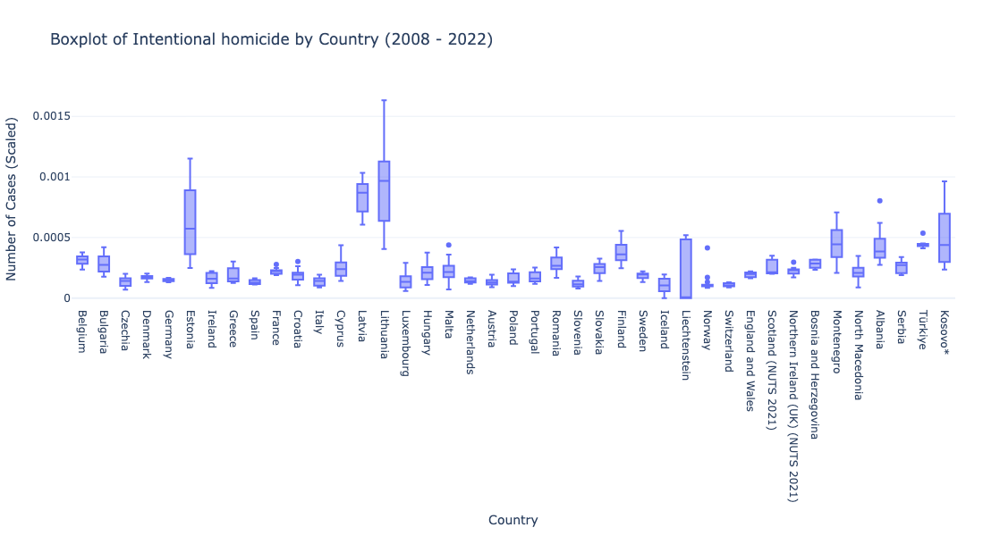

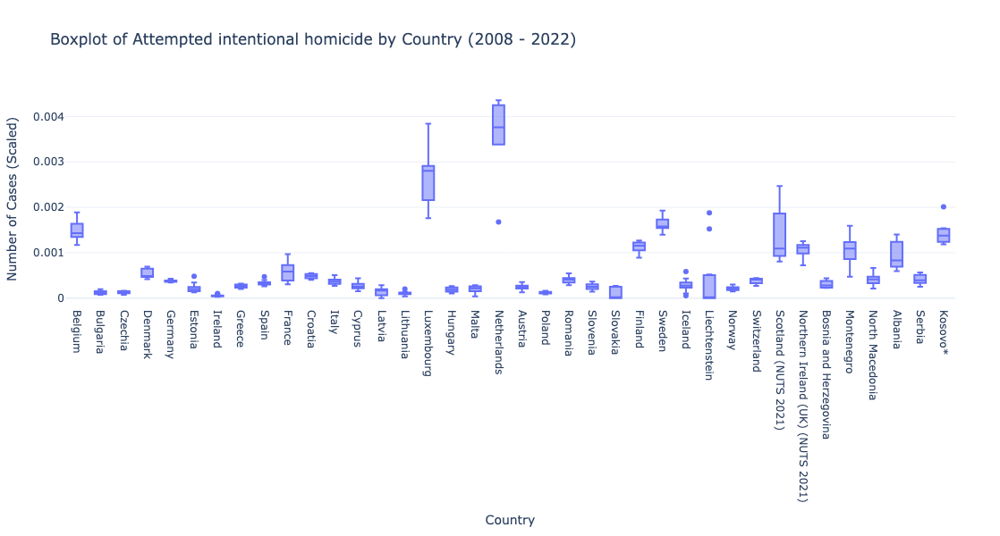

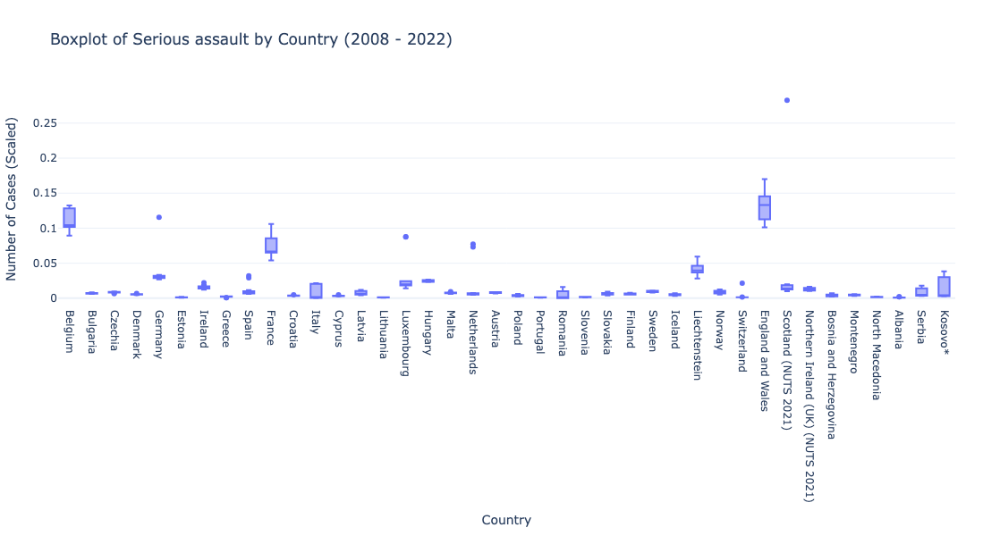

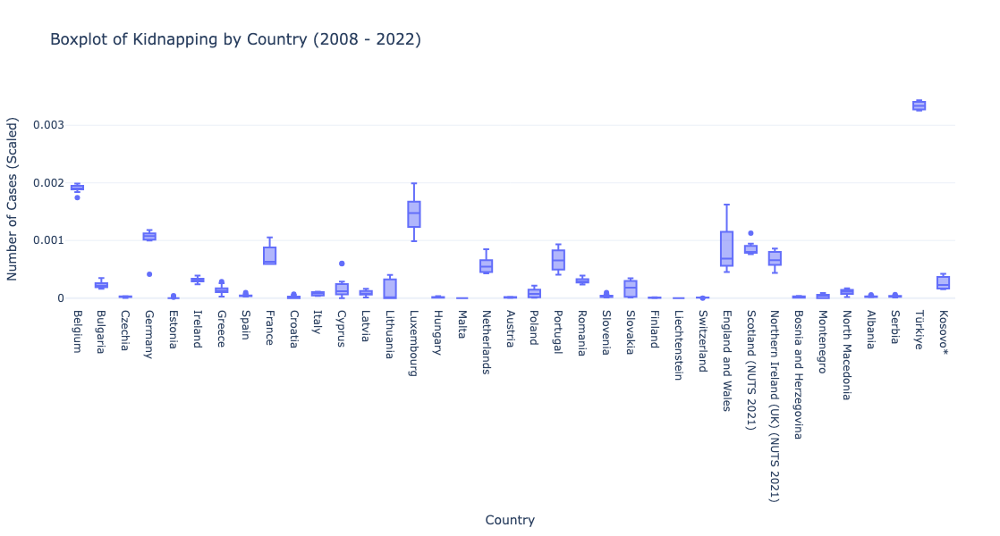

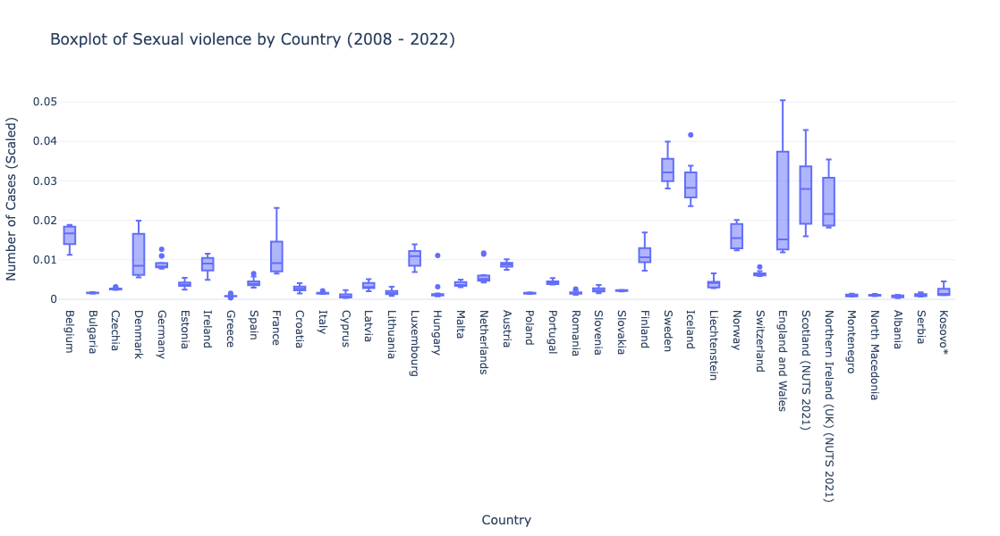

...

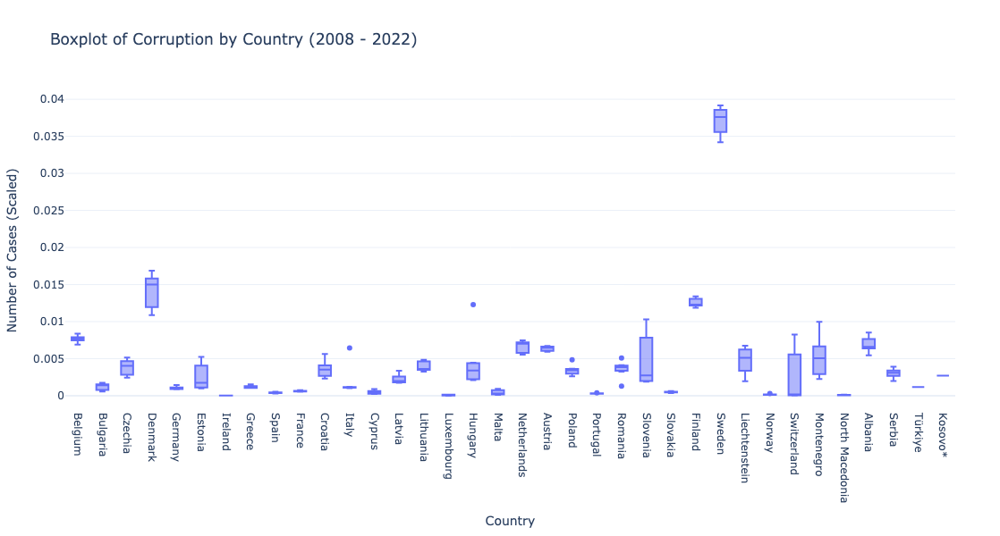

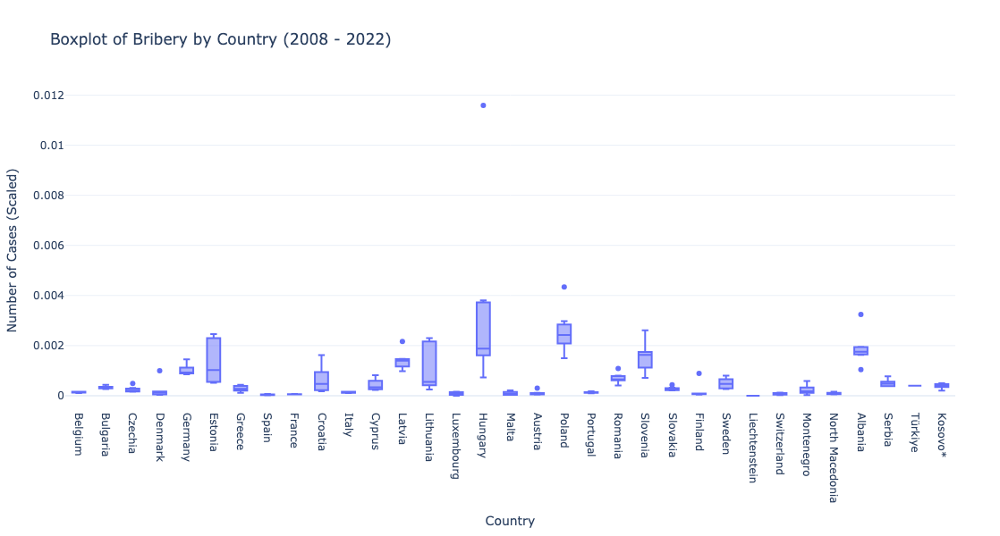

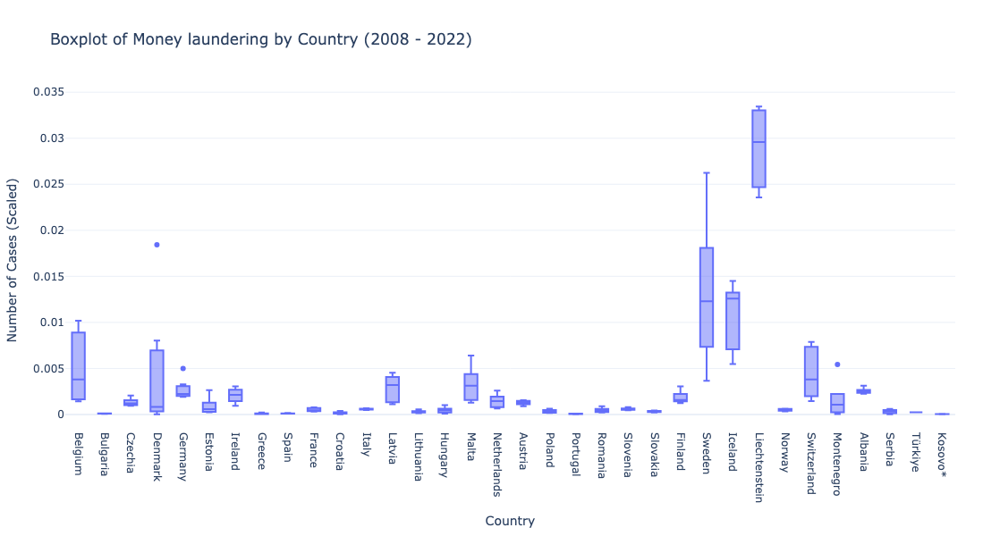

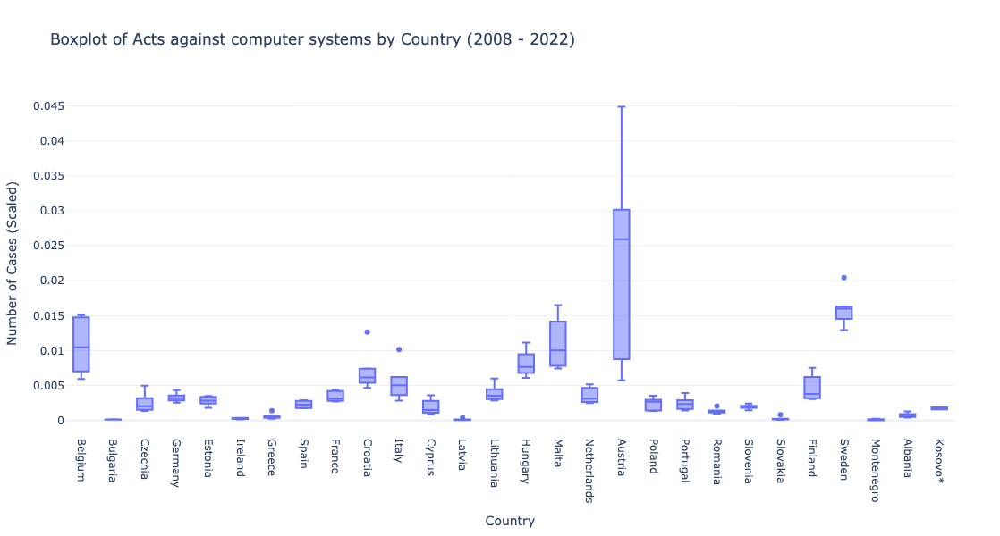

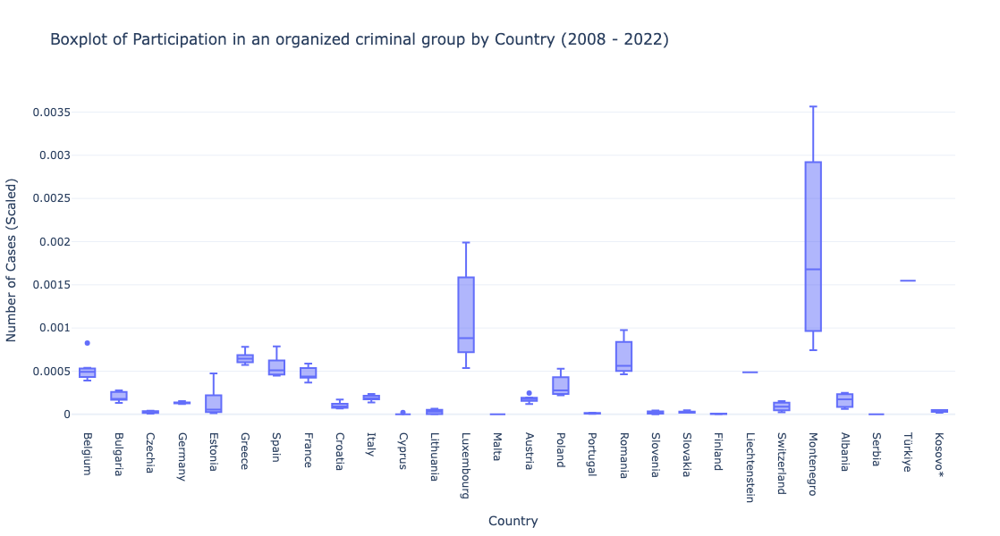

In [40]:
# Unique crime types
crime_types = crime['International classification of crime for statistical purposes (ICCS)'].unique()

# Iterate over each crime type and create a box plot
for crime_type in crime_types:
    crime_data = crime[crime['International classification of crime for statistical purposes (ICCS)'] == crime_type]
    fig_box = px.box(crime_data, x='Geopolitical entity (reporting)', y='norm_val',
                     title=f'Boxplot of {crime_type} by Country ({crime["Time"].min()} - {crime["Time"].max()})')

    fig_box.update_layout(
        xaxis_title='Country',
        yaxis_title='Number of Cases (Scaled)',
        template='plotly_white',
        width=900,  # Set the width of the plot
        height=600,  # Set the height of the plot
        margin=dict(l=50, r=50, t=100, b=50)  # Add margins to prevent squishing
    )

    fig_box.update_xaxes(tickangle=90)

    # Show the figure
    fig_box.show()

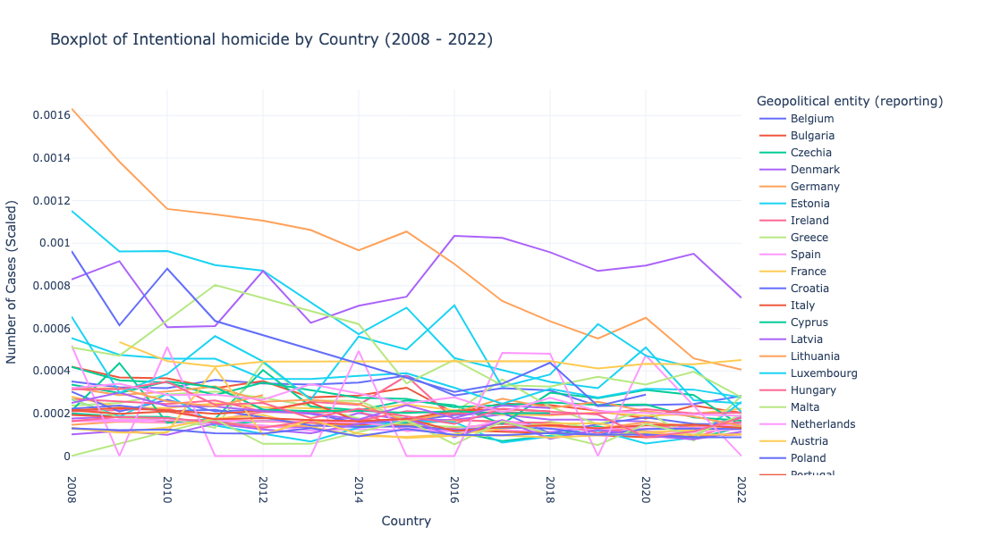

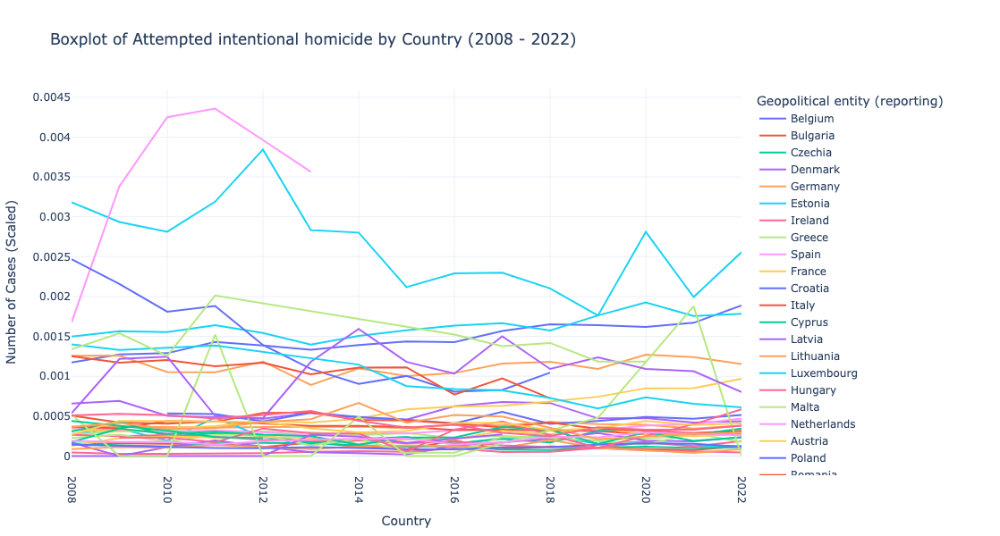

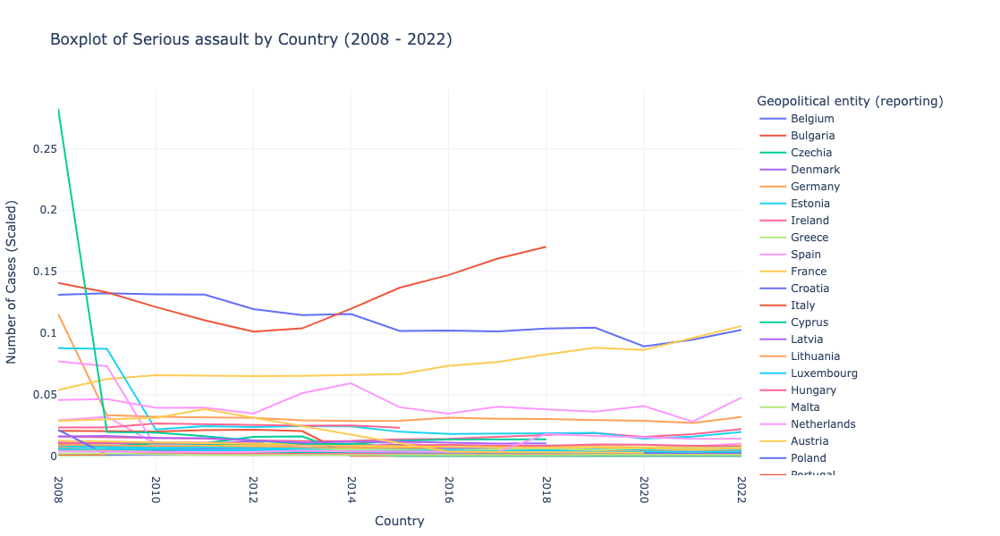

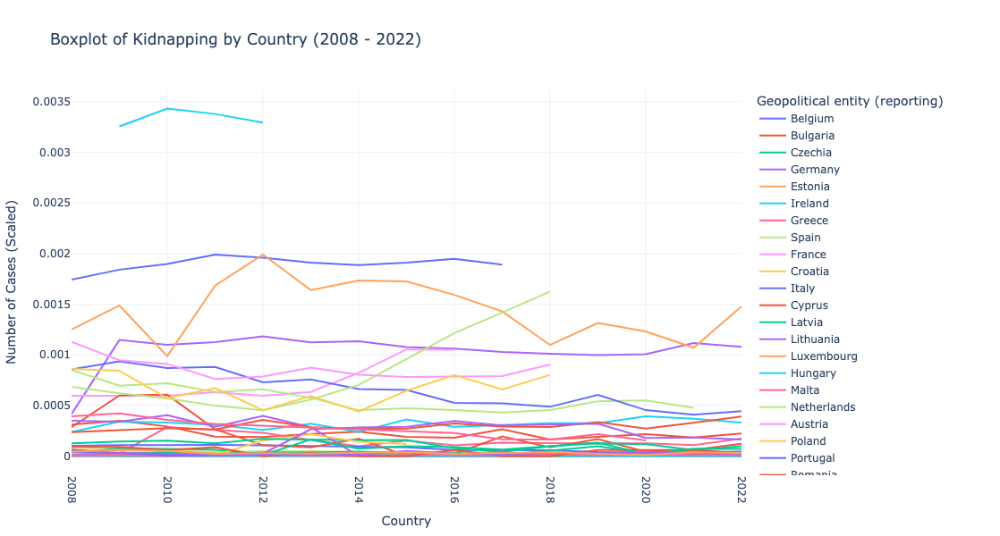

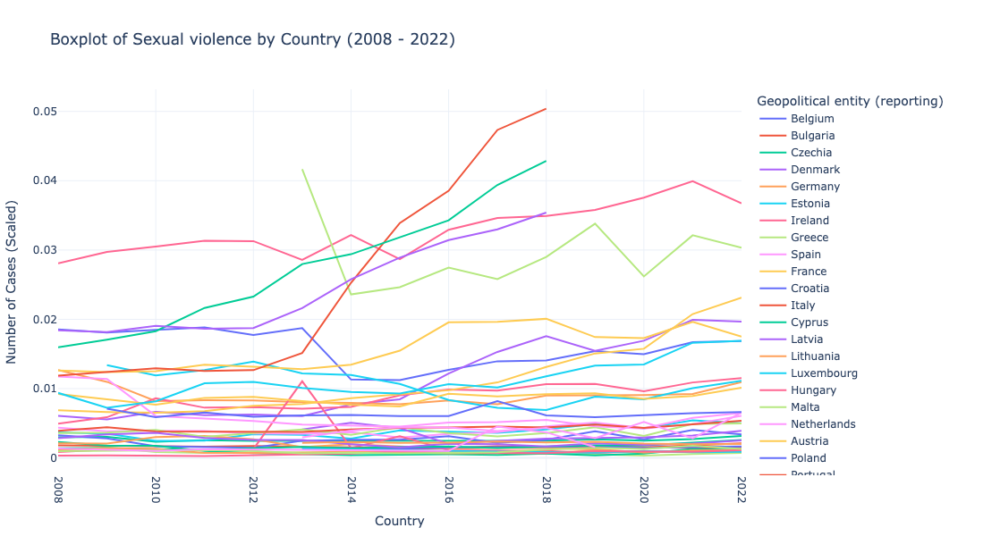

...

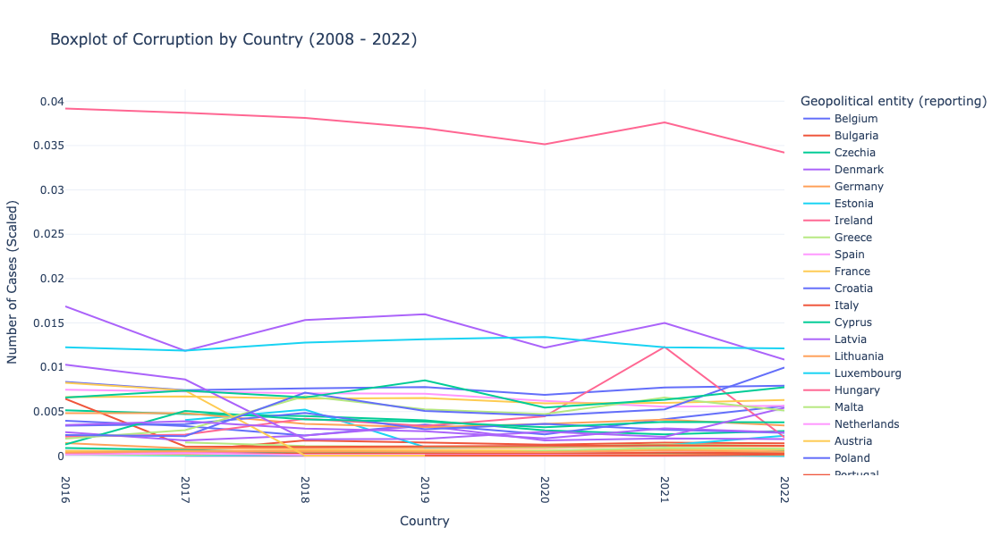

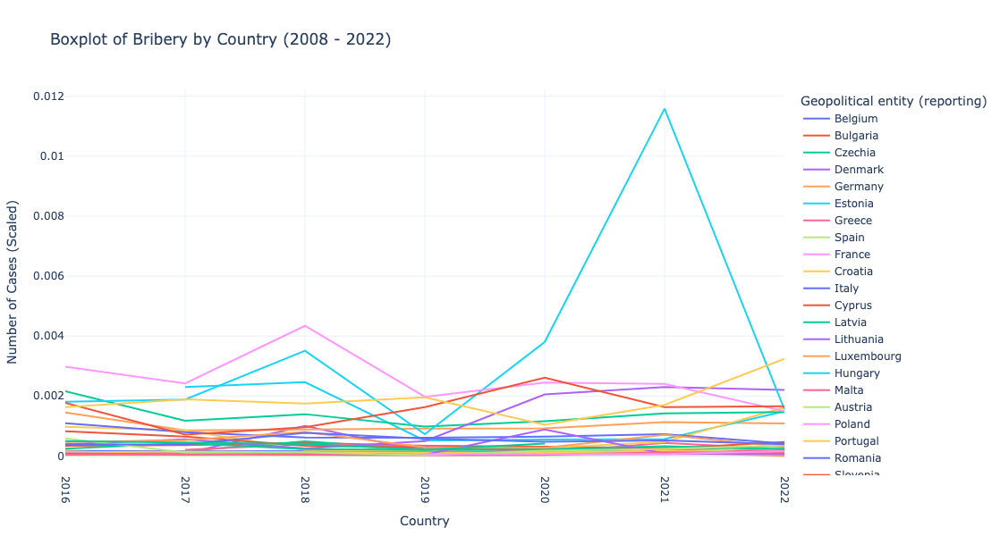

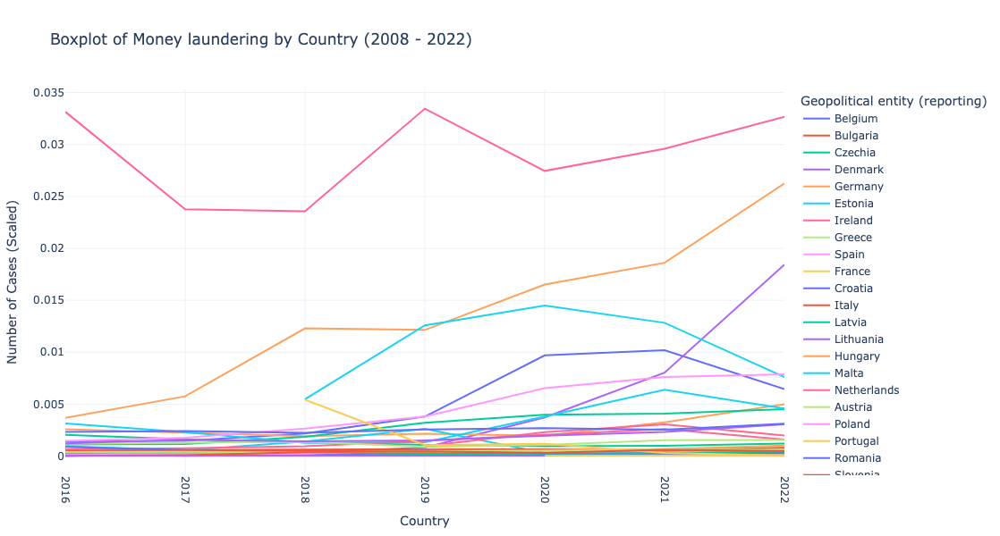

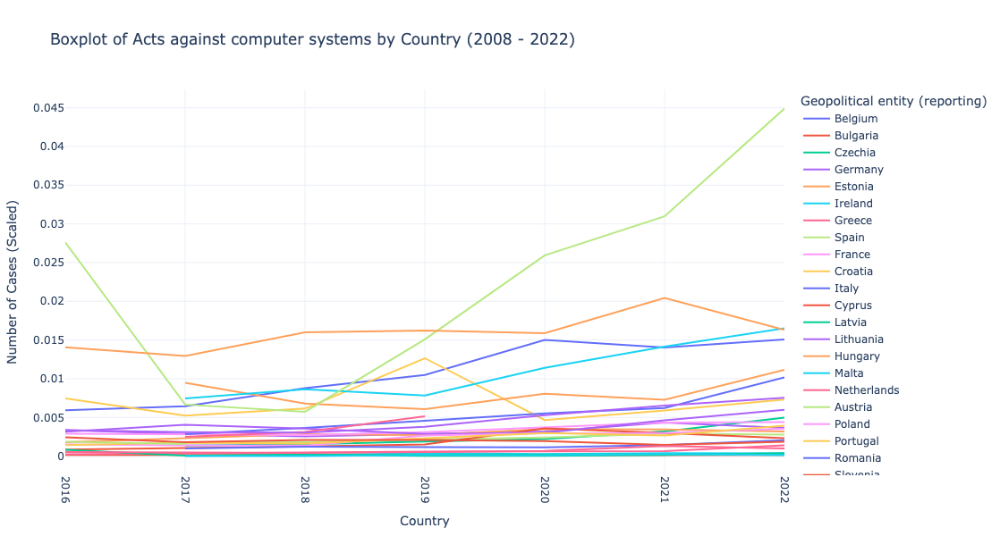

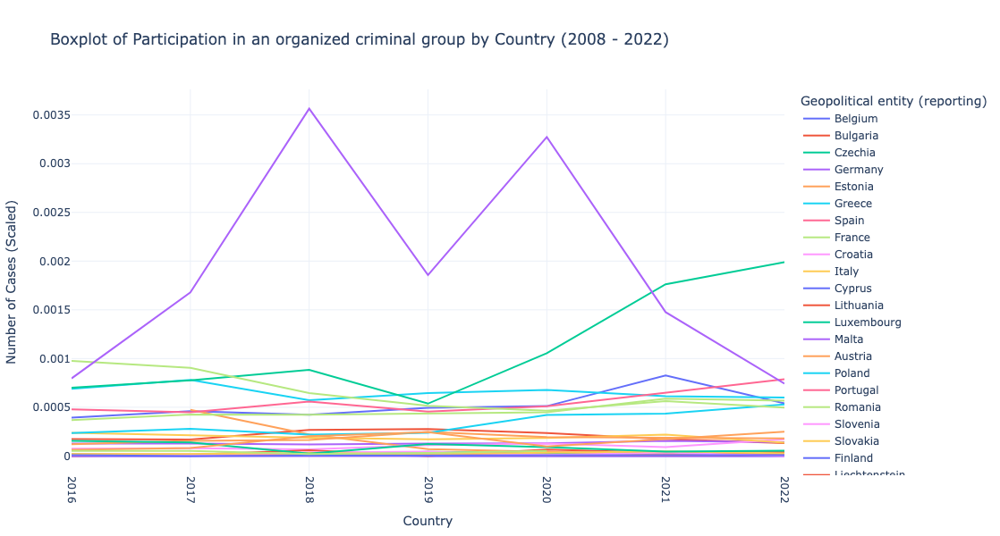

In [44]:
# Unique crime types
crime_types = crime['International classification of crime for statistical purposes (ICCS)'].unique()

# Iterate over each crime type and create a line plot
for crime_type in crime_types:
    crime_data = crime[crime['International classification of crime for statistical purposes (ICCS)'] == crime_type]
    fig_box = px.line(crime_data, x='Time', y='norm_val',
                     title=f'Lineplot of {crime_type} by Country ({crime["Time"].min()} - {crime["Time"].max()})', 
                      color='Geopolitical entity (reporting)')

    fig_box.update_layout(
        xaxis_title='Country',
        yaxis_title='Number of Cases (Scaled)',
        template='plotly_white',
        width=900,  # Set the width of the plot
        height=600,  # Set the height of the plot
        margin=dict(l=50, r=50, t=100, b=50)  # Add margins to prevent squishing
    )

    fig_box.update_xaxes(tickangle=90)

    # Show the figure
    fig_box.show()